# Comparison of Clustering Methods


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")

c:\Users\valer\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
import os

datasets = {}

for f in os.listdir('./data'):
  datasets[f.replace('.csv', '')] = pd.read_csv('./data/'+f)

In [3]:
def plot_clusters(dict_df):
  fig, axes = plt.subplots(nrows=6, ncols=5,figsize=(25,30))

  i = 0
  j = 0

  for key, df in dict_df.items():
    axes[i,j].scatter(df['x'], df['y'], c=df['color'], s=10, cmap = "Set3")
    axes[i,j].set_title(key)

    if j == 4:
      i += 1
      j = 0
    else:
      j += 1

  plt.tight_layout()

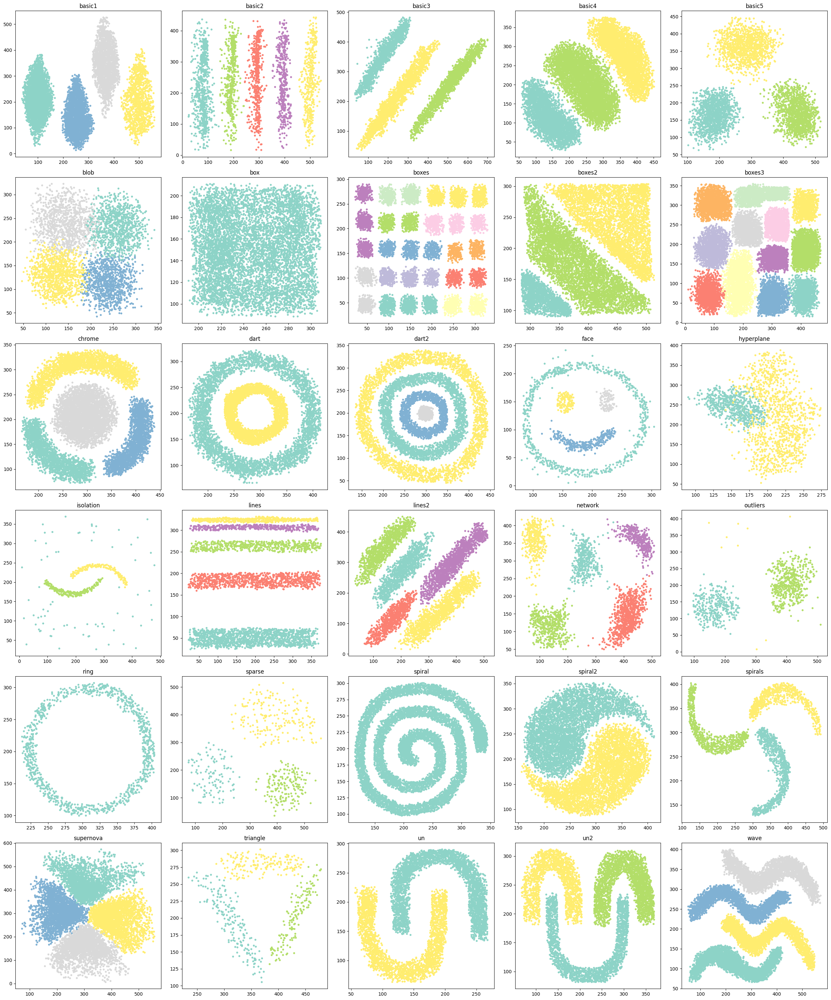

In [4]:
plot_clusters(datasets)

## K-Means

To perform K-Means we need to set a fixed number of clusters we want to obtain. Here we are testing how each method performs with respect to different shapes of data distributions. Therefore, for the sake of simplicity, I set as number of cluster the true one. In reality, we should perform additional analysis (like the knee-elbow one) to choose the right hyperparameter.

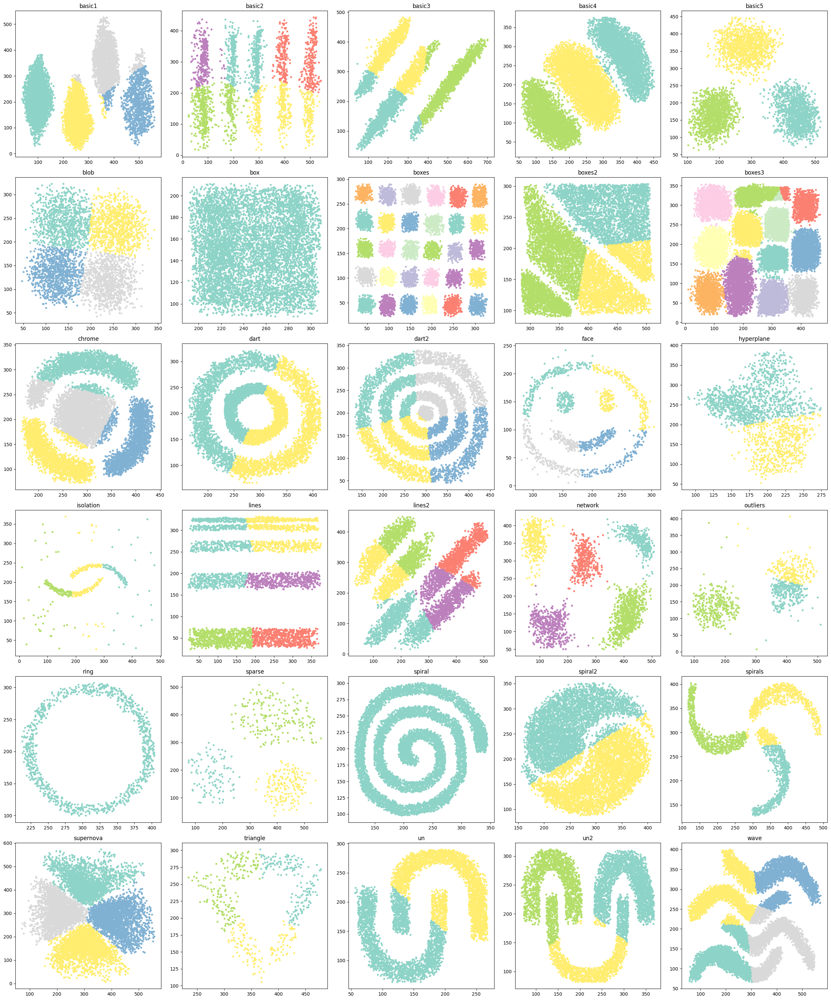

In [5]:
from sklearn.cluster import KMeans

kmeans_cluster = {}

for key, df in datasets.items():
  temp = df.copy()
  est = KMeans(df['color'].nunique())
  temp['color'] = est.fit_predict(df[['x', 'y']])
  kmeans_cluster[key] = temp

plot_clusters(kmeans_cluster)

K-Means fails to capture the right clustering for many cases. It best performs in case of globular shapes.

## Hierarchical

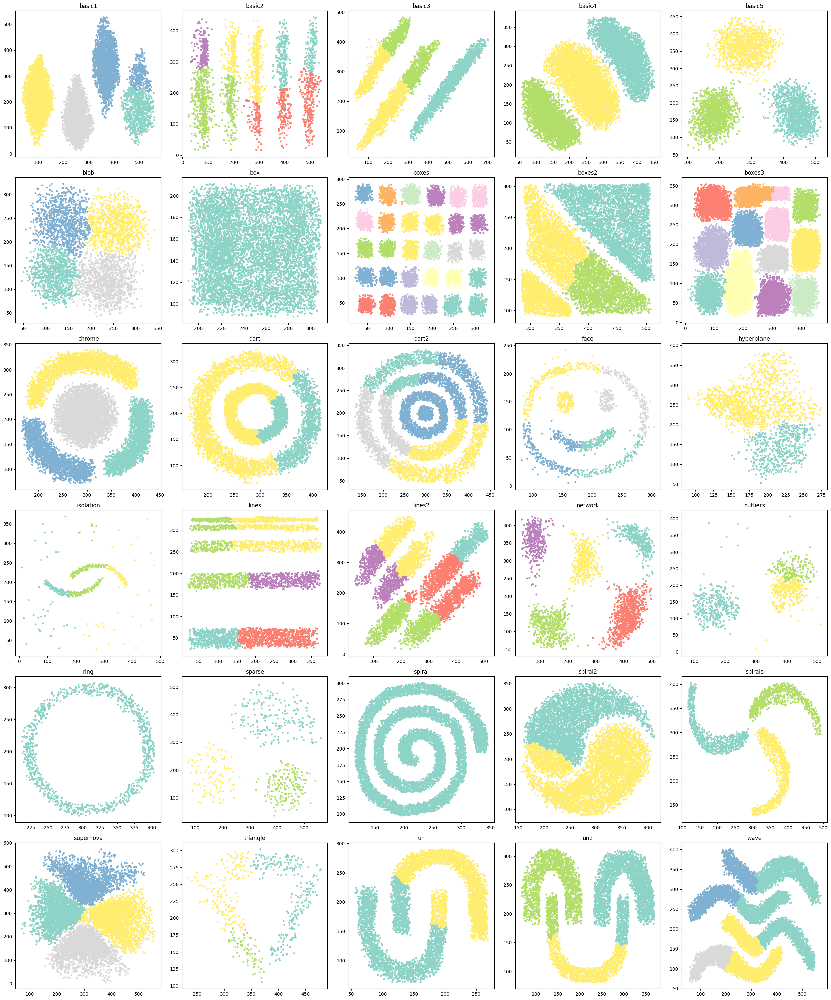

In [6]:
from scipy.cluster.hierarchy import linkage, fcluster

hierarchy_cluster = {}

for key, df in datasets.items():
  temp = df.copy()
  distance_matrix = linkage(temp[['x', 'y']], method='ward', metric='euclidean')
  temp['color'] = fcluster(distance_matrix, df['color'].nunique(), criterion='maxclust')
  hierarchy_cluster[key] = temp


plot_clusters(hierarchy_cluster)

## HDBSCAN

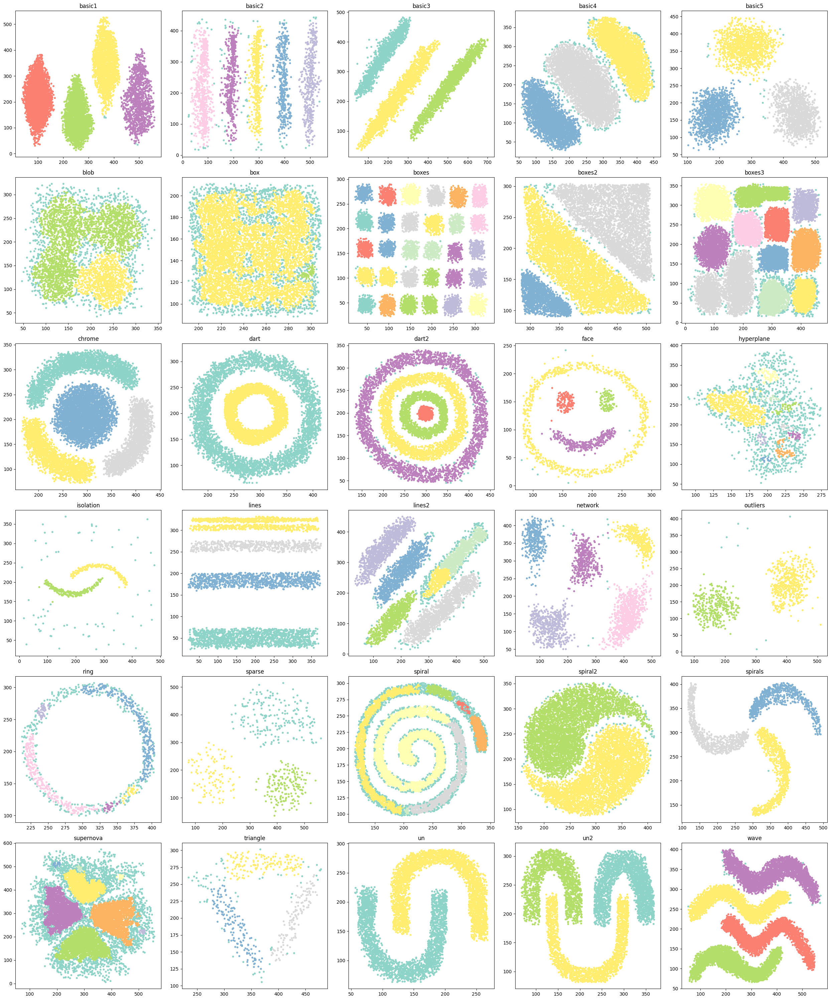

In [8]:
import hdbscan

clusters = {}

for key, df in datasets.items():
  temp = df.copy()
  est = hdbscan.HDBSCAN(min_cluster_size=15)
  temp['color'] = est.fit_predict(df[['x', 'y']])
  clusters[key] = temp

plot_clusters(clusters)

Conclusions: there is no clustering method that outperforms the other. The main insight is the best method is higly connected to the shape of the distributions: for globular shaper K-Means and Hierarchical outperform the density based, which is better in case of non-globular shapes given that relies on changing density of points to detect clusters.